In [30]:
import pandas as pd
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt

In [31]:
# Helper functions
def preprocess_data(df):
    df['liquidity'] = df['bid_sz_00'] * df['bid_px_00'] + df['ask_sz_00'] * df['ask_px_00']
    return df

def calculate_rsi(data, window=14):
    delta = data.diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

def calculate_vol_and_liquidity(price_df, volume_df, window_size):
    # Calculating rolling statistics
    rolling_mean_vol = price_df.pct_change().rolling(window=window_size).mean()
    rolling_std_vol = price_df.pct_change().rolling(window=window_size).std()
    rolling_mean_liq = volume_df.rolling(window=window_size).mean()
    rolling_std_liq = volume_df.rolling(window=window_size).std()
    
    return rolling_mean_vol, rolling_std_vol, rolling_mean_liq, rolling_std_liq

def get_percentile(current_value, mean, std):
    if std > 0:
        z_score = (current_value - mean) / std
        percentile = norm.cdf(z_score)
    else:
        percentile = 0.5  # No variation
    return percentile

def get_trade_price(base_price, current_vol, current_liq, mean_vol, std_vol, mean_liq, std_liq, trade_direction):
    vol_percentile = get_percentile(current_vol, mean_vol, std_vol)
    liq_percentile = get_percentile(current_liq, mean_liq, std_liq)

    # Defining price adjustment scenarios based on market conditions
    if vol_percentile >= 0.9 and liq_percentile < 0.1:
        price_adjustment_percent = np.random.uniform(-0.25, -0.15)
    elif vol_percentile <= 0.1 and liq_percentile < 0.1:
        price_adjustment_percent = np.random.uniform(-0.10, -0.05)
    elif vol_percentile >= 0.9 and liq_percentile >= 0.9:
        price_adjustment_percent = np.random.uniform(-0.05, +0.10)
    else:
        price_adjustment_percent = np.random.uniform(-0.05, +0.05)  # Default for normal conditions

    # Adjusting price based on trade direction
    if trade_direction == 'BUY':
        adjusted_price = base_price * (1 - price_adjustment_percent)
    else:  # SELL
        adjusted_price = base_price * (1 + price_adjustment_percent)
    
    return adjusted_price


In [32]:
INITIAL_CASH = 10_000_000  # $10 million

class TradingBlotter:
    def __init__(self, data, model_predictions, daily_trading_limit, window_size):
        self.data = preprocess_data(data)
        self.predictions = model_predictions
        self.daily_trading_limit = daily_trading_limit
        self.window_size = window_size
        self.reset()

    def reset(self):
        self.current_step = 0
        self.portfolio = {'cash': INITIAL_CASH, 'holdings': {ticker: 0 for ticker in self.data['symbol'].unique()}}
        self.trades = []
        self.calculate_indicators()

    def calculate_indicators(self):
        self.data['RSI'] = calculate_rsi(self.data['price'])
        self.data['pct_change'] = self.data['price'].pct_change()
        self.data['rolling_mean_vol'], self.data['rolling_std_vol'], self.data['rolling_mean_liq'], self.data['rolling_std_liq'] = calculate_vol_and_liquidity(self.data['price'], self.data['liquidity'], self.window_size)

    def step(self):
        row = self.data.iloc[self.current_step]
        current_price = row['price']
        current_time = pd.to_datetime(row['ts_event'])
        current_vol = row['pct_change']
        current_liq = row['liquidity']
        mean_vol = row['rolling_mean_vol']
        std_vol = row['rolling_std_vol']
        mean_liq = row['rolling_mean_liq']
        std_liq = row['rolling_std_liq']

        prediction = self.predictions[self.current_step]

        if prediction == 1:  # BUY
            trade_direction = 'BUY'
            trade_price = get_trade_price(current_price, current_vol, current_liq, mean_vol, std_vol, mean_liq, std_liq, trade_direction)
            trade_size = (self.portfolio['cash'] * np.random.uniform(0.001, 0.005)) / trade_price
            if self.portfolio['cash'] >= trade_size * trade_price:
                self.portfolio['cash'] -= trade_size * trade_price
                self.portfolio['holdings'][row['symbol']] += trade_size
                trade_status = 'filled'
            else:
                trade_status = 'cancelled'
                trade_size = 0
        elif prediction == 2:  # SELL
            trade_direction = 'SELL'
            if self.portfolio['holdings'][row['symbol']] > 0:
                trade_size = min(self.portfolio['holdings'][row['symbol']], self.portfolio['cash']*np.random.uniform(0.001, 0.005) / current_price)
                trade_price = get_trade_price(current_price, current_vol, current_liq, mean_vol, std_vol, mean_liq, std_liq, trade_direction)
                self.portfolio['cash'] += trade_size * trade_price
                self.portfolio['holdings'][row['symbol']] -= trade_size
                trade_status = 'filled'
            else:
                trade_status = 'cancelled'
                trade_size = 0
        else:  # HOLD
            trade_direction = 'HOLD'
            trade_size = 0
            trade_price = current_price
            trade_status = 'skipped'

        if trade_size > 0:
            transaction_cost = self._calculate_transaction_cost(row['Volume'], 0.3, self.data['Volume'].mean())
            slippage = abs(trade_price - current_price)
            
            self.trades.append({
                'step': self.current_step,
                'timestamp': current_time,
                'action': trade_direction,
                'price': trade_price,
                'shares': trade_size,
                'symbol': row['symbol'],
                'transaction_cost': transaction_cost,
                'slippage': slippage,
                'portfolio_value': self.get_portfolio_value()
            })

        self.current_step += 1
        return self.current_step >= len(self.data) - 1

    def _calculate_transaction_cost(self, volume, volatility, daily_volume):
        return volatility * np.sqrt(volume / daily_volume)

    def get_portfolio_value(self):
        row = self.data.iloc[self.current_step]
        return self.portfolio['cash'] + sum(self.portfolio['holdings'][symbol] * row['price'] for symbol in self.portfolio['holdings'])

    def run(self):
        self.reset()
        while not self.step():
            pass
        return self.trades

    def calculate_metrics(self):

        trades_df = pd.DataFrame(self.trades)
    
        initial_value = INITIAL_CASH
        final_value = self.get_portfolio_value()
        total_return = (final_value - initial_value) / initial_value
        
        daily_returns = trades_df['portfolio_value'].pct_change().dropna()
        sharpe_ratio = np.sqrt(252) * daily_returns.mean() / daily_returns.std()
        
        cumulative_returns = (1 + daily_returns).cumprod()
        drawdown = (cumulative_returns.cummax() - cumulative_returns) / cumulative_returns.cummax()
        max_drawdown = drawdown.max()
        
        profitable_trades = trades_df[trades_df['action'] == 'SELL']
        win_rate = len(profitable_trades) / len(trades_df) if len(trades_df) > 0 else 0
        
        avg_profit = profitable_trades['price'].mean() * profitable_trades['shares'].mean() if len(profitable_trades) > 0 else 0
        avg_loss = (trades_df[trades_df['action'] == 'BUY']['price'].mean() * 
                    trades_df[trades_df['action'] == 'BUY']['shares'].mean())
        
        gross_profit = (profitable_trades['price'] * profitable_trades['shares']).sum()
        gross_loss = (trades_df[trades_df['action'] == 'BUY']['price'] * 
                    trades_df[trades_df['action'] == 'BUY']['shares']).sum()
        profit_factor = gross_profit / abs(gross_loss) if gross_loss != 0 else float('inf')

        # Calculating total portfolio value
        total_portfolio_value = self.get_portfolio_value()

        for trade in self.trades:
            print(f"Step: {trade['step']}, Timestamp: {trade['timestamp']}, Action: {trade['action']}, Price: {trade['price']}, Shares: {trade['shares']}, Symbol: {trade['symbol']}, Transaction Cost: {trade['transaction_cost']}, Slippage: {trade['slippage']}")

        # Plot portfolio value over time
        plt.figure(figsize=(12, 6))
        plt.plot(trades_df['timestamp'], trades_df['portfolio_value'])
        plt.title('Portfolio Value Over Time')
        plt.xlabel('Date')
        plt.ylabel('Portfolio Value')
        plt.show()
        
        return {
            'Total Return': total_return,
            'Sharpe Ratio': sharpe_ratio,
            'Max Drawdown': max_drawdown,
            'Number of Trades': len(trades_df),
            'Win Rate': win_rate,
            'Avg Profit per Trade': avg_profit,
            'Avg Loss per Trade': avg_loss,
            'Profit Factor': profit_factor,
            'Total Portfolio Value': total_portfolio_value
        }


Step: 4, Timestamp: 2023-07-03 08:07:20.349525673, Action: BUY, Price: 193.18979138074766, Shares: 146.31651860377752, Symbol: AAPL, Transaction Cost: 0.02537527050553077, Slippage: 0.9202086192523495
Step: 5, Timestamp: 2023-07-03 08:07:21.830530495, Action: SELL, Price: 202.62619589698915, Shares: 146.31651860377752, Symbol: AAPL, Transaction Cost: 0.08024365104036953, Slippage: 8.556195896989152
Step: 170, Timestamp: 2023-07-03 08:15:34.807292509, Action: BUY, Price: 194.364908960462, Shares: 230.25097456207467, Symbol: AAPL, Transaction Cost: 0.5075054101106153, Slippage: 0.3149089604619917
Step: 171, Timestamp: 2023-07-03 08:15:34.818372344, Action: SELL, Price: 186.0238534786192, Shares: 155.52989598750057, Symbol: AAPL, Transaction Cost: 0.09827800007342893, Slippage: 8.02614652138081
Step: 173, Timestamp: 2023-07-03 08:15:48.500381446, Action: SELL, Price: 187.80852949175318, Shares: 74.72107857457411, Symbol: AAPL, Transaction Cost: 0.3588605169780759, Slippage: 6.241470508246

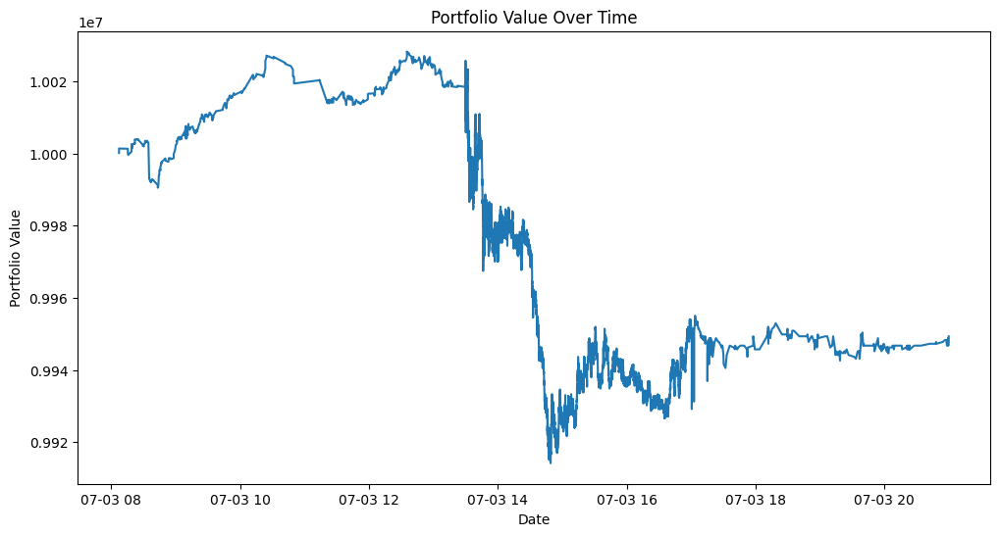

Total Return         -0.0051        
Sharpe Ratio         -0.0474        
Max Drawdown         0.0114         
Number of Trades     55786.0000     
Win Rate             0.0040         
Avg Profit per Trade 20240.6386     
Avg Loss per Trade   260.5343       
Profit Factor        0.3108         
Total Portfolio Value 9949360.8643   


In [33]:

data = pd.read_csv('data/df_with_predictions.csv')

ticker = 'AAPL' 
ticker_data = data[data['symbol'] == ticker]

model_predictions = ticker_data['prediction'].to_numpy()

blotter = TradingBlotter(ticker_data, model_predictions, daily_trading_limit=1000, window_size=14)
trades = blotter.run()
model_metrics = blotter.calculate_metrics()
for metric in model_metrics.keys():
        print(f"{metric:<20} {model_metrics[metric]:<15.4f}")